### **Understanding the Task**
The aim of this assignment is to create a deep learning model capable of adapting an existing work to resemble the aesthetic of any art. The model should be able to analyze the artistic style of the selected art and apply similar stylistic features to a new, original artwork, creating a piece that seems as though it could have been created by the artist themselves.

Achieving the aim can be done by the using the concept of **Neural Style Transfer**.

### **Importing the necessary Libraries**

In [1]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.optim as optim
from torchvision import transforms, models
%matplotlib inline

### **Checking for the device**

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cpu


### **Image Loading and Printing Function**

#### **Image Load function**
This function take the path of the image and covert and open it into only 3 channles of **RGB**. Also it is necessary to resize the image into the **400x400** sizes along with converting the image into the tensor and Normalize the image.


**Normalization** takes first tuple as mean and next tuple as the std dev. The values taken in the tuple is the values calculated across all images in the training set of **ImageNet**. So we can also take the default values (0 and 1) but is will be optimal for taking these values.

In [3]:
def image_loading(img_path, max_size=400, shape=None):
    # Load and convert the image to RGB format
    image = Image.open(img_path).convert('RGB')

    # Ensure that the image dimensions are <= 400 pixels in both x and y
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)

    # Override the size if a specific shape is provided
    if shape is not None:
        size = shape

    # Define a series of transformations using transforms.Compose
    in_transform = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    ])

    # Discard the transparent, alpha channel and add the batch dimension
    image = in_transform(image)[:3, :, :].unsqueeze(0)

    return image

#### **Tensor To Image Function**

In this step we convert the tensor of image into NumPy and again using the mean and std we covert the image into its initial values. It may possible that the values will be greater than 1, this situation is handle using the cliping

In [4]:
def image_from_tensor(tensor):
    """ Print the image from the From Image Tensor. """

    # Clone and detach the tensor, move it to the CPU
    image = tensor.to("cpu").clone().detach()

    # Convert the tensor to a NumPy array and rearrange dimensions
    image = image.numpy().squeeze().transpose(1, 2, 0)

    # Undo normalization and clipping to restore original pixel values
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = np.clip(image, 0, 1)

    return image


## **Content and Style Image**

In [5]:
# load in content and style image
content = image_loading('/content/content01.jpg').to(device)
style = image_loading('/content/style01.jpg', shape=content.shape[-2:]).to(device)

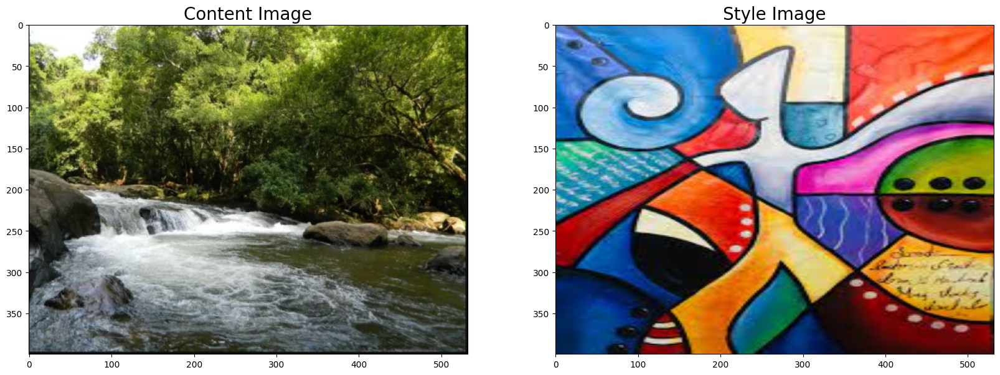

In [6]:
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
# content and style ims side-by-side
ax1.imshow(image_from_tensor(content))
ax1.set_title("Content Image",fontsize = 20)
ax2.imshow(image_from_tensor(style))
ax2.set_title("Style Image", fontsize = 20)
plt.show()

## **Neural Style Transfer**

In case of neural style transfer, we have initially generated a random image (it is good to start with a content image, so that lower epochs required to coverge quickly). After that we will calculate the difference of the generated image with the content image and the style image, adding these differences will be known as Loss.

The step of calculation of loss requires the extraction of feature which can be done using a pretrained ConvNet, in the current case i am using the VGGNet.

After extracting the feature of all the three images we can calculate the loss and using backpropogation we can optimize the initial value of target image.

### **Downloading the VGGNet**

In [7]:
"""Obtain the "features" segment of VGG19 (excluding the "classifier" part) """

vgg = models.vgg19(pretrained=True).features

# Freeze all parameters of VGG since we're solely optimizing the target image
for param in vgg.parameters():
    param.requires_grad_(False)

vgg.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

Below function takes a image and apply it to the VGG model to calculate the feature of the crossponding image for any specific image.

In [8]:
def extract_features(image, model, layers=None):
    """ Forward pass an image through a model and extract features for
        a specified set of layers. Default layers correspond to VGGNet as per Gatys et al. (2016)
    """
    ## Layers needed for content and style representations of an image
    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': 'conv2_1',
                  '10': 'conv3_1',
                  '19': 'conv4_1',
                  '21': 'conv4_2',
                  '28': 'conv5_1'}

    features = {}
    x = image
    # model._modules is a dictionary containing each module in the model
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x

    return features


### **Loss Calculation for Content**

Here the conv4_2 layer is used to comparing the target and content features, which is the 2nd last layer of VGG net

In [9]:
def content_loss_calc(target_feature, content_feature):
    loss = torch.mean((target_feature['conv4_2'] - content_feature['conv4_2'])**2)
    return loss

### **Loss Calculation for Style Image**

Calculation of loss for the style image involves the calculation of gram_matrix (it is a matrix which used to compare the style information of set of feature maps from the convolution neural network). Using the differen of the Gram Matrix value of the style image and the content image, we add them all and get the style loss

In [10]:
def calculate_gram_matrix(tensor):
    # Get the batch_size, depth, height, and width of the Tensor
    _, d, h, w = tensor.size()

    # Reshape so we're multiplying the features for each channel
    tensor = tensor.view(d, h * w)

    # Calculate the Gram matrix
    gram = torch.mm(tensor, tensor.t())

    return gram

In [11]:
def style_loss_calc(target_features, style_grams):
    style_weights = {'conv1_1': 1.,
                  'conv2_1': 0.75,
                  'conv3_1': 0.2,
                  'conv4_1': 0.2,
                  'conv5_1': 0.2}
    # the style loss
    # initialize the style loss to 0
    style_loss = 0
    # then add to it for each layer's gram matrix loss
    for layer in style_weights:
        # get the "target" style representation for the layer
        target_feature = target_features[layer]
        target_gram = calculate_gram_matrix(target_feature)
        _, d, h, w = target_feature.shape
        # get the "style" style representation
        style_gram = style_grams[layer]
        # the style loss for one layer, weighted appropriately
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        # add to the style loss
        style_loss += layer_style_loss / (d * h * w)

    return style_loss

### **Running Gradient Decent**

This step involves calculation of all the losses and backpropogate through the losses to optimize the picxel values of the target images. It involves 500 epochs and for each of the loss there is a weight assigned to them, known as alpha and beta.

As i have initialized my input image as a content image so during calculation of loss i have assigned a higher weight to the style loss.

In [12]:
def StyleTransfer(content, style):
    # extraction the features for content and style
    content_features = extract_features(content, vgg)
    style_features = extract_features(style, vgg)

    # calculate the gram matrices for each layer of our style representation
    style_grams = {layer: calculate_gram_matrix(style_features[layer]) for layer in style_features}

    # create a third "target" image and prep it for change it is a good idea to start of with the
    # target as a copy of our *content* image then iteratively change its style
    target = content.clone().requires_grad_(True).to(device)

    style_weights = {'conv1_1': 1.,
                'conv2_1': 0.75,
                'conv3_1': 0.4,
                'conv4_1': 0.2,
                'conv5_1': 0.2}

    alpha = 1
    beta = 1e9

    # iteration hyperparameters
    optimizer = optim.Adam([target], lr=0.003)
    steps = 750  # decide how many iterations to update your image (5000)

    for i in range(1, steps+1):
        target_features = extract_features(target, vgg)
        # the content loss
        content_loss = content_loss_calc(target_features, content_features)
        # the style loss
        style_loss = style_loss_calc(target_features, style_grams)

        # calculate the *total* loss
        total_loss = alpha * content_loss + beta * style_loss

        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        if i%25 == 0:
            print("Current Loss - {:.2f}".format(total_loss))
            fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(7,7))
            ax1.imshow(image_from_tensor(content))
            ax1.set_title("Content Image", fontsize=2)
            ax2.imshow(image_from_tensor(style))
            ax2.set_title("Style Image", fontsize=2)
            ax3.imshow(image_from_tensor(target))
            ax3.set_title("Stylized Image", fontsize=2)
            plt.show()
    return target

Current Loss - 380429271040.00


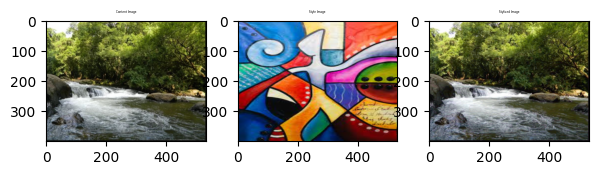

Current Loss - 314915979264.00


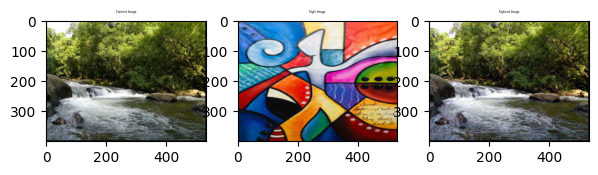

Current Loss - 271710388224.00


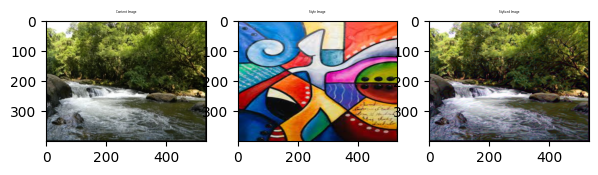

Current Loss - 241606066176.00


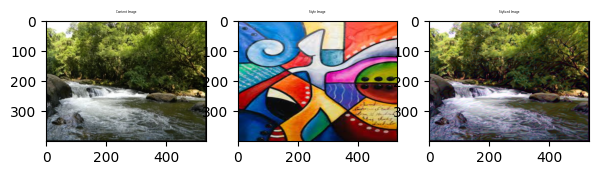

Current Loss - 217478496256.00


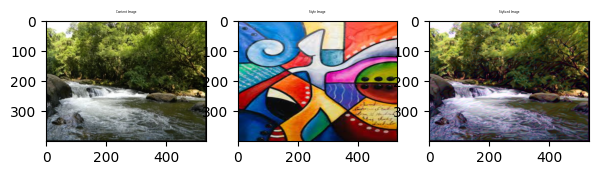

Current Loss - 196458184704.00


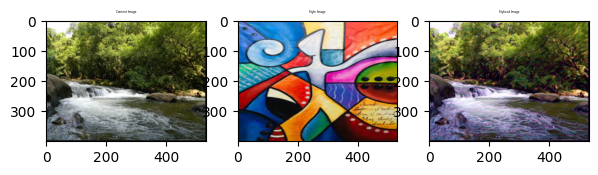

Current Loss - 177638916096.00


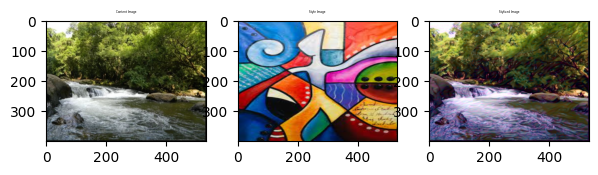

Current Loss - 160973389824.00


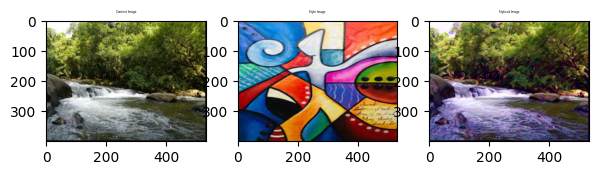

Current Loss - 146629853184.00


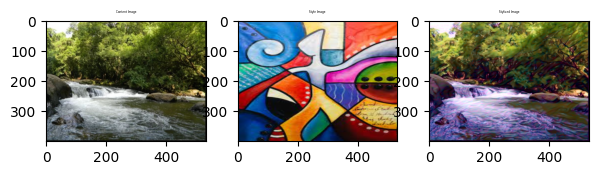

Current Loss - 134601261056.00


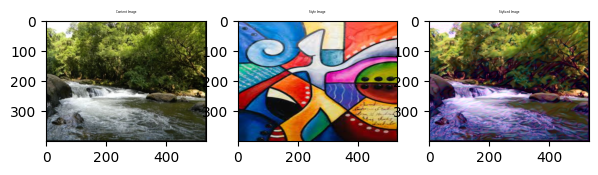

Current Loss - 124585992192.00


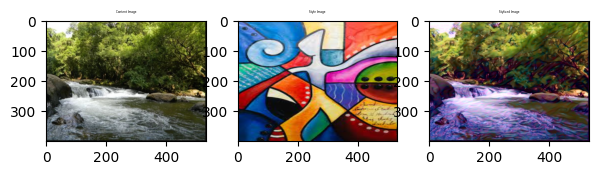

Current Loss - 116086218752.00


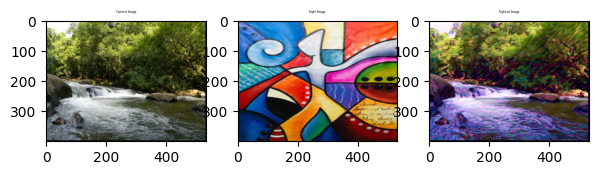

Current Loss - 108547653632.00


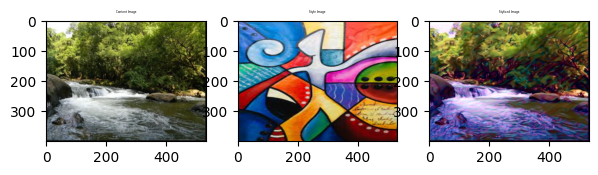

Current Loss - 101492244480.00


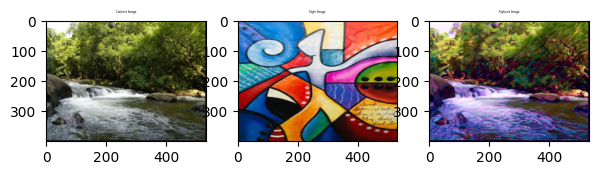

Current Loss - 94592851968.00


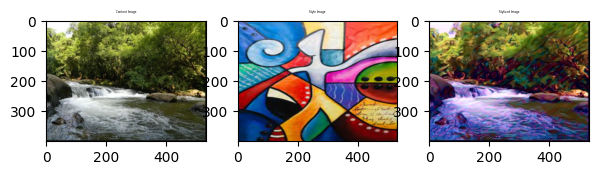

Current Loss - 87673978880.00


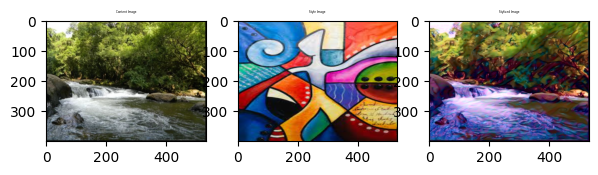

Current Loss - 80671481856.00


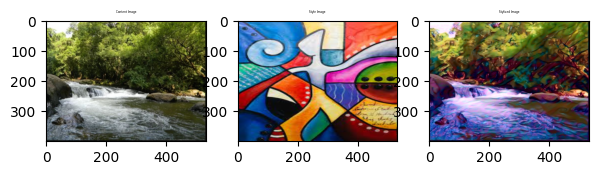

Current Loss - 73607176192.00


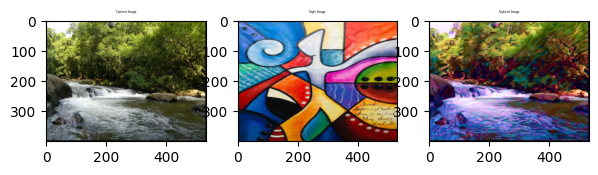

Current Loss - 66565894144.00


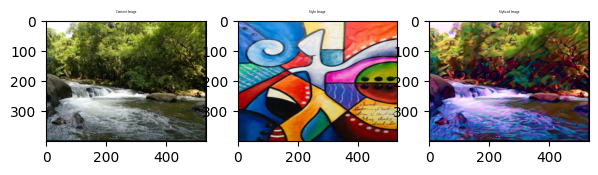

Current Loss - 59677003776.00


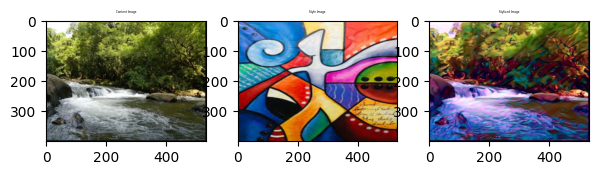

Current Loss - 53083201536.00


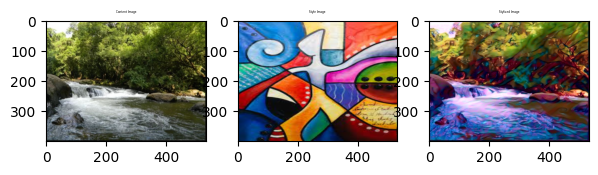

Current Loss - 46927323136.00


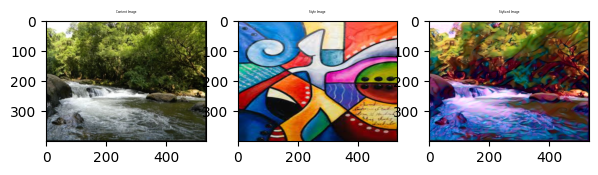

Current Loss - 41327624192.00


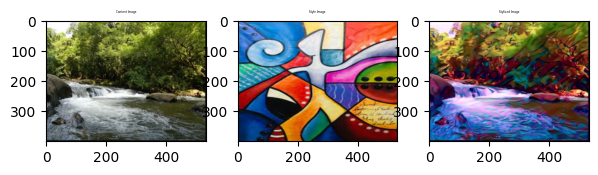

Current Loss - 36356640768.00


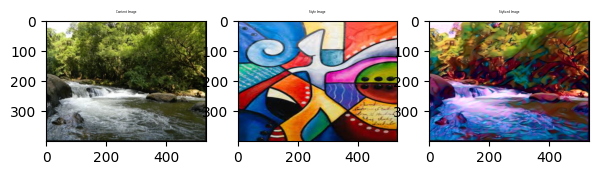

Current Loss - 32038985728.00


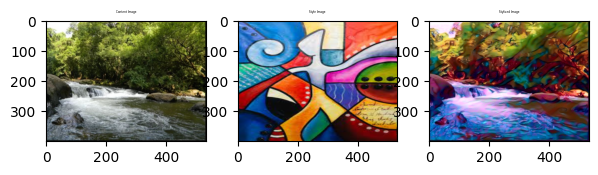

Current Loss - 28358119424.00


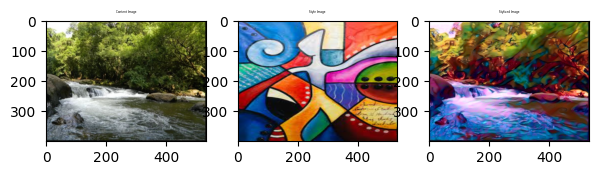

Current Loss - 25254088704.00


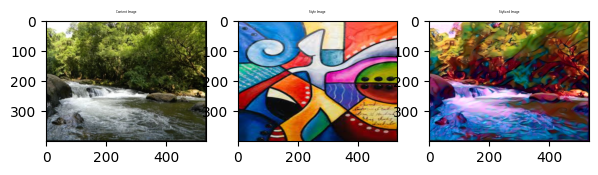

Current Loss - 22653126656.00


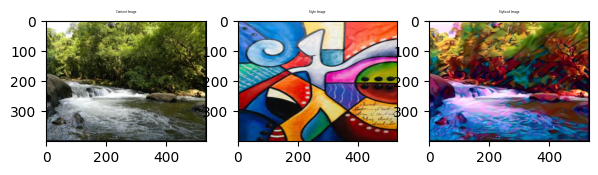

Current Loss - 20477208576.00


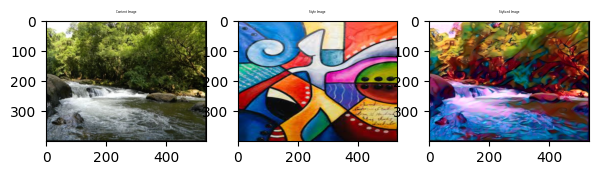

Current Loss - 18650083328.00


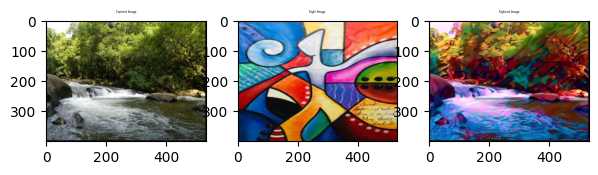

In [13]:
target = StyleTransfer(content, style)

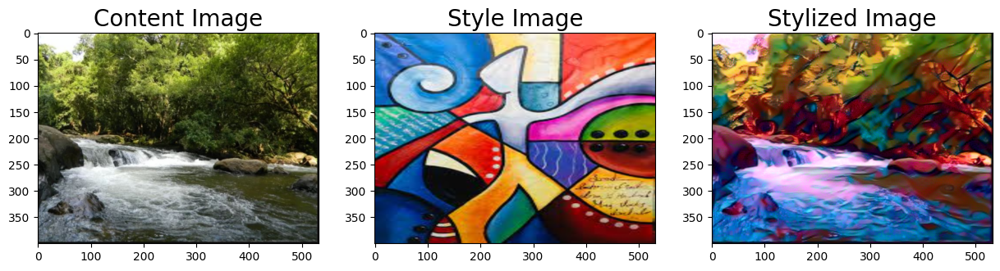

In [14]:
# Display content and final target image
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 15))
ax1.imshow(image_from_tensor(content))
ax1.set_title("Content Image", fontsize=20)
ax2.imshow(image_from_tensor(style))
ax2.set_title("Style Image", fontsize=20)
ax3.imshow(image_from_tensor(target))
ax3.set_title("Stylized Image", fontsize=20)
plt.show()

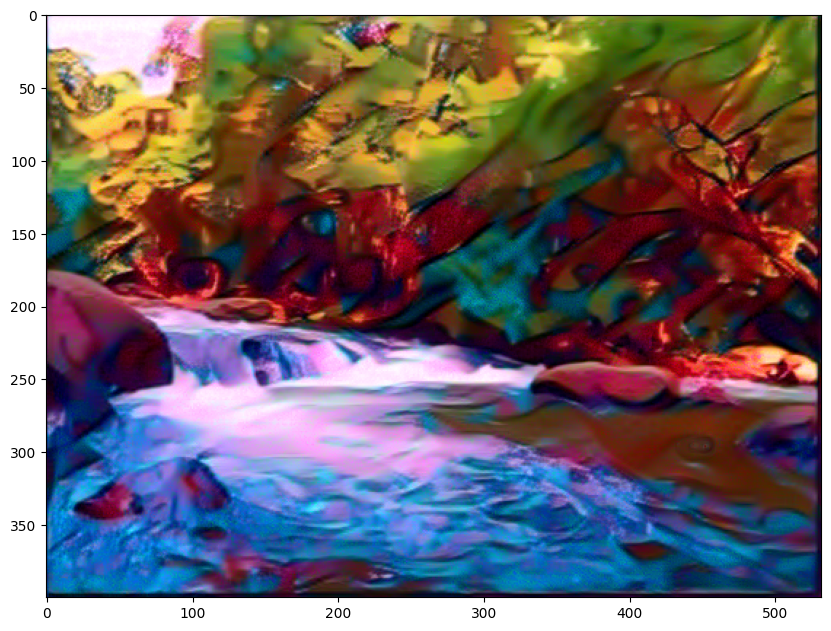

In [15]:
plt.figure(figsize = (10,10))
plt.imshow(image_from_tensor(target))
plt.show()

### **Testing on a New Image**

Current Loss - 1042316066816.00


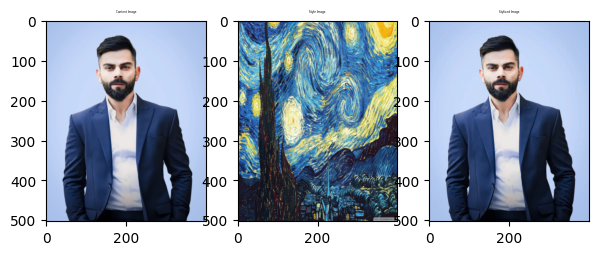

Current Loss - 640183828480.00


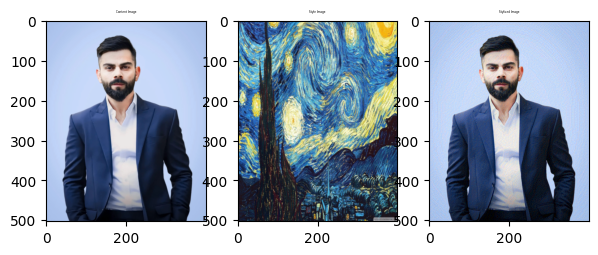

Current Loss - 417934868480.00


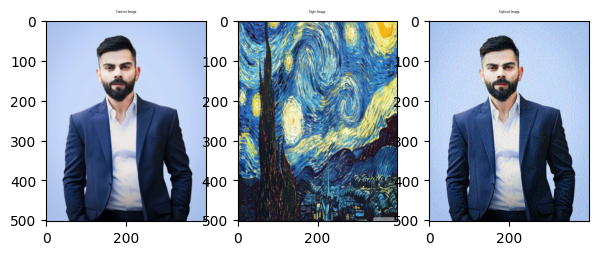

Current Loss - 284350283776.00


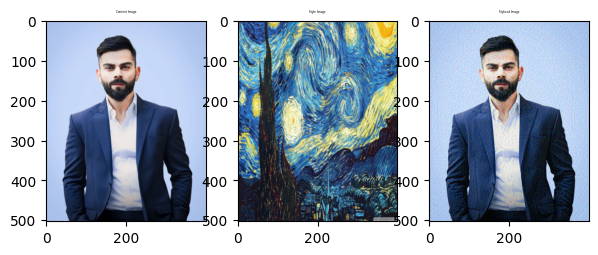

Current Loss - 203896586240.00


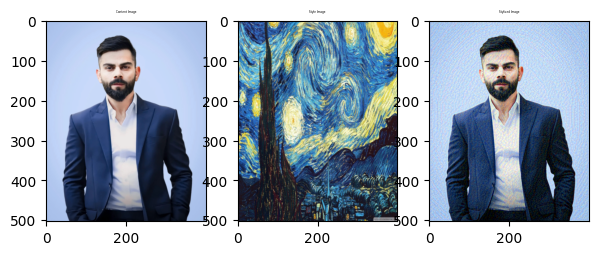

Current Loss - 155071922176.00


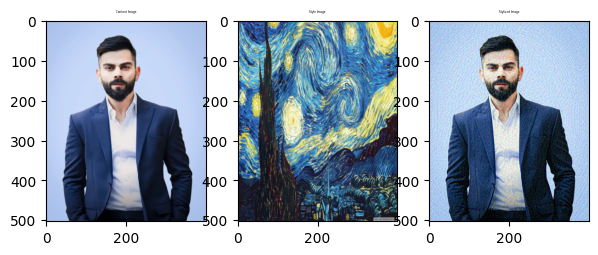

Current Loss - 124269600768.00


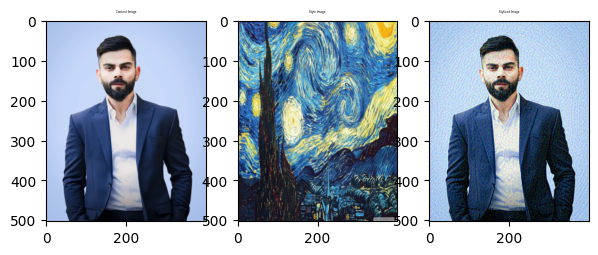

Current Loss - 103692189696.00


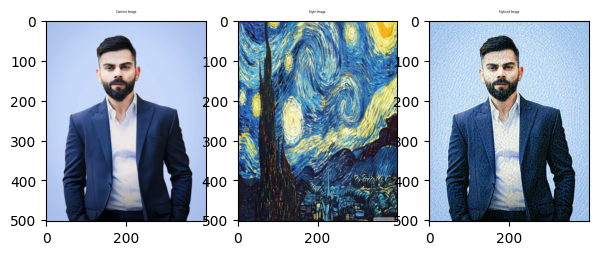

Current Loss - 89136037888.00


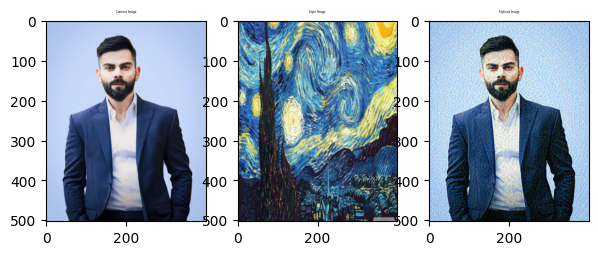

Current Loss - 78319616000.00


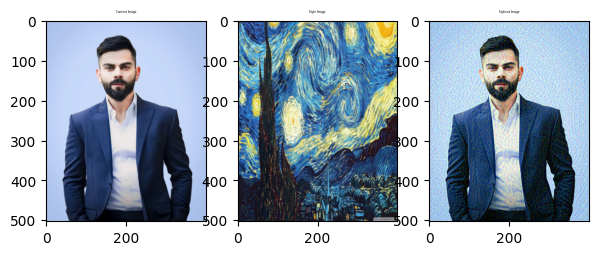

Current Loss - 69947088896.00


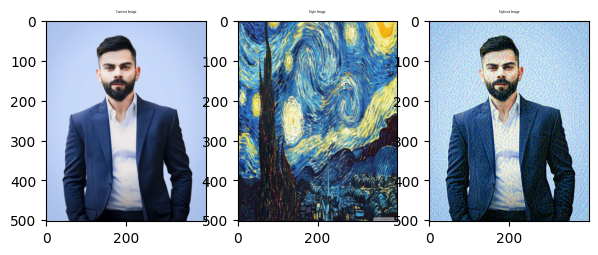

Current Loss - 63239241728.00


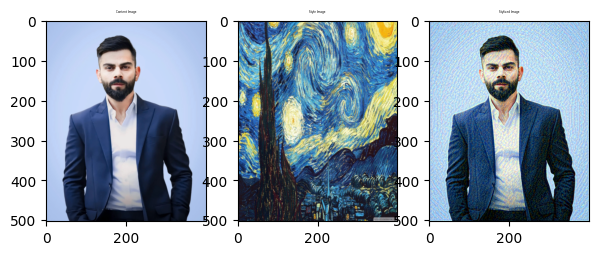

Current Loss - 57729216512.00


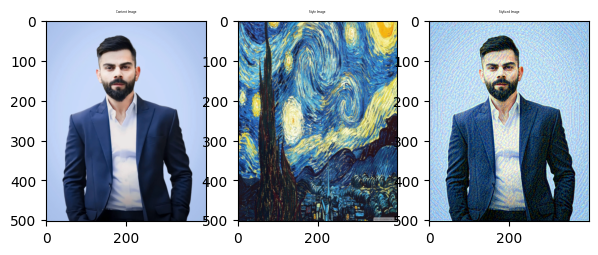

Current Loss - 53112291328.00


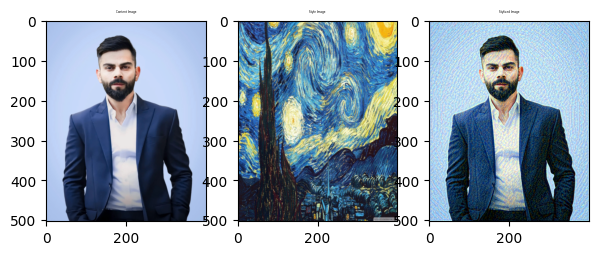

Current Loss - 49186643968.00


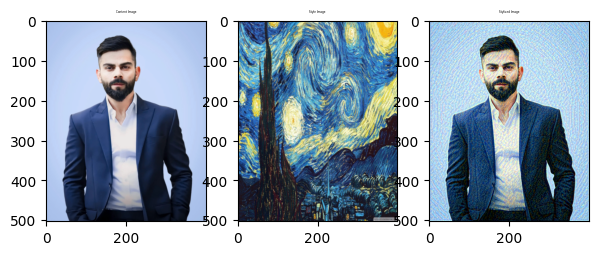

Current Loss - 45811507200.00


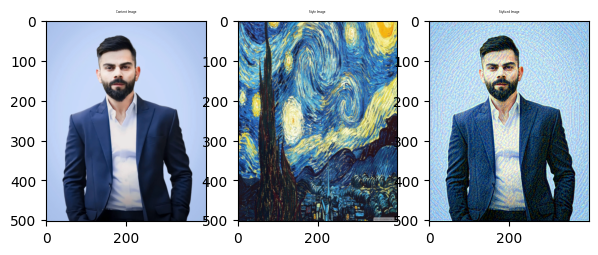

Current Loss - 42879180800.00


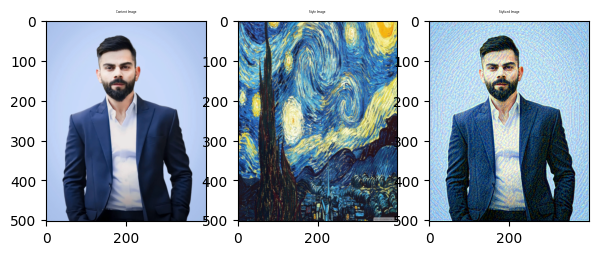

Current Loss - 40306724864.00


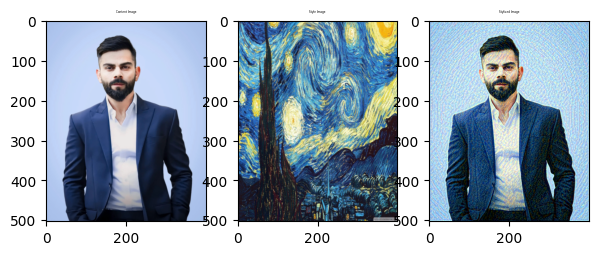

Current Loss - 38036787200.00


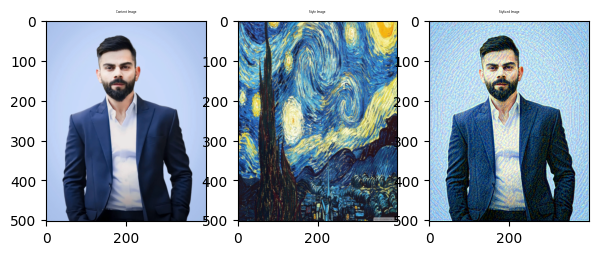

Current Loss - 36023275520.00


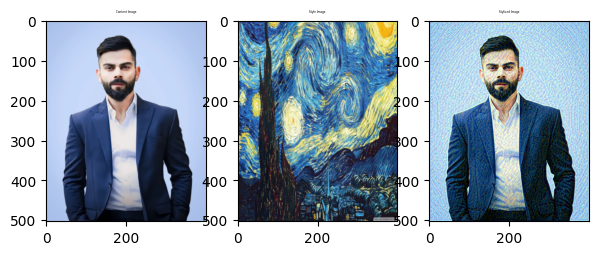

Current Loss - 34227650560.00


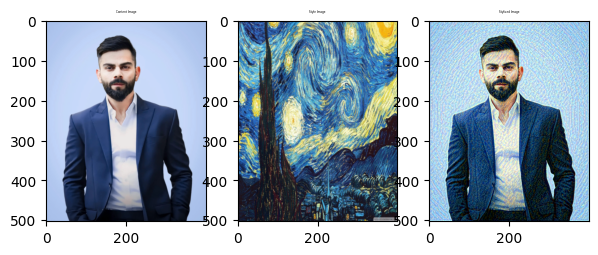

Current Loss - 32616316928.00


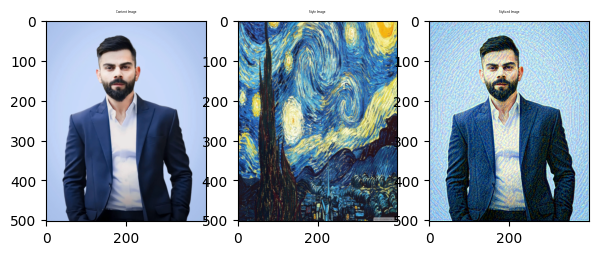

Current Loss - 31162120192.00


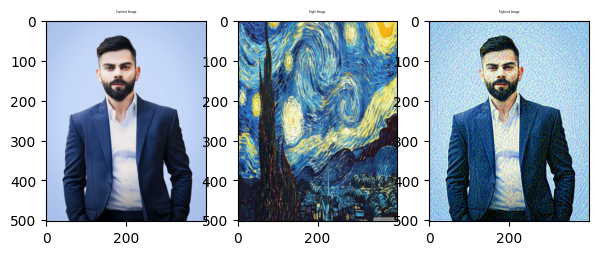

Current Loss - 29843550208.00


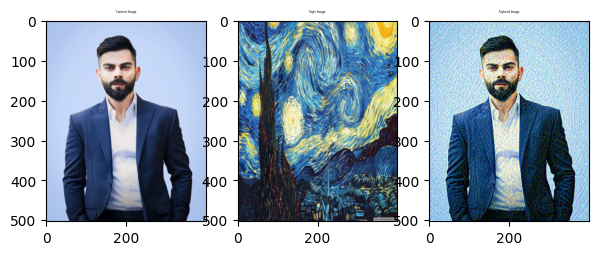

Current Loss - 28641531904.00


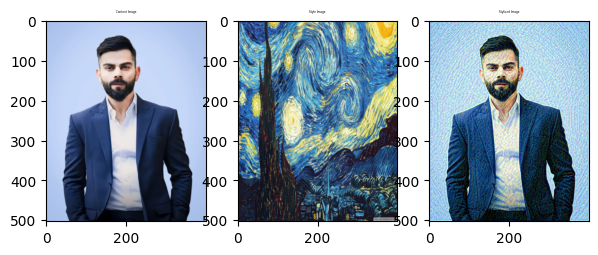

Current Loss - 27539359744.00


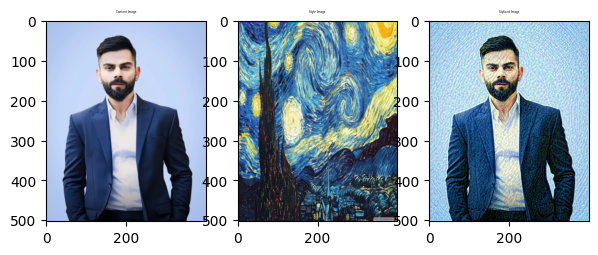

Current Loss - 26525235200.00


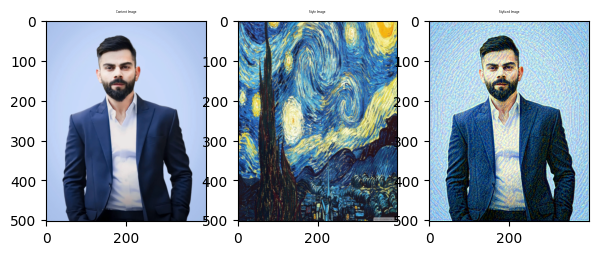

Current Loss - 25586558976.00


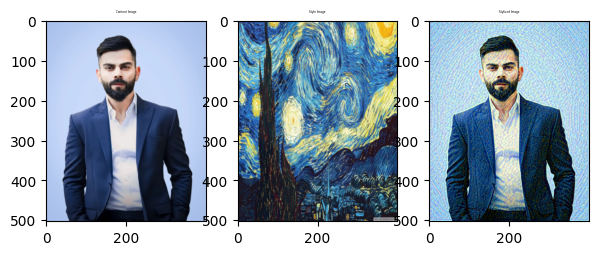

Current Loss - 24714123264.00


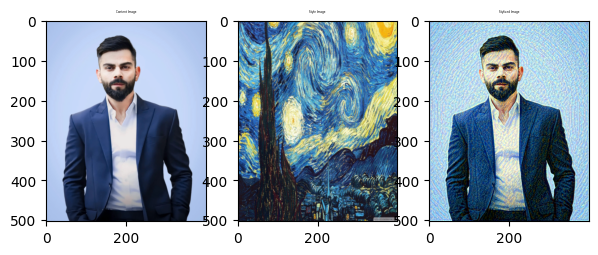

Current Loss - 23899820032.00


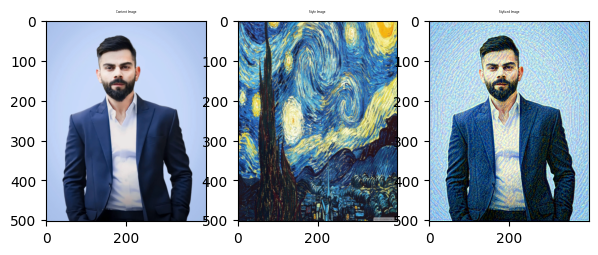

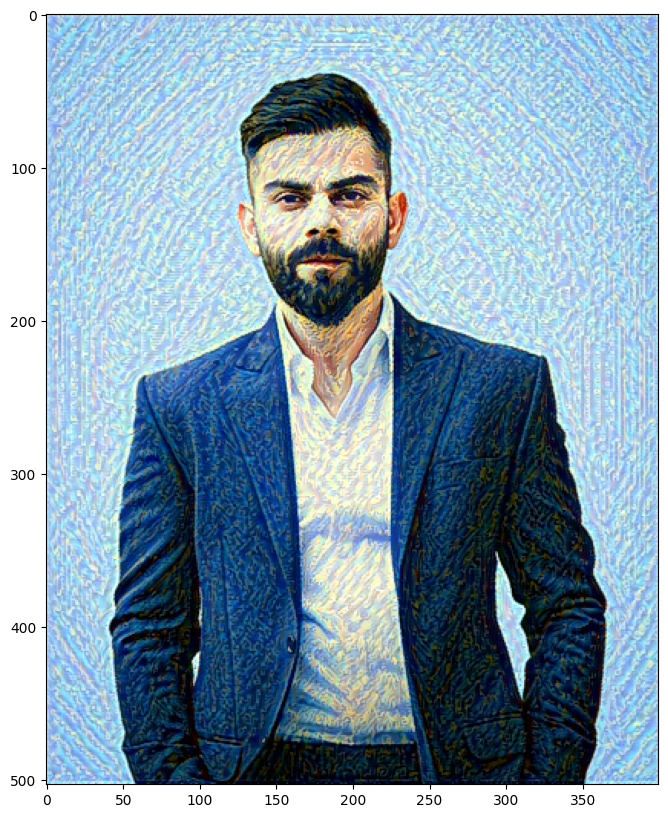

In [16]:
content = image_loading('/content/content.jpg').to(device)
style = image_loading('/content/style.jpg', shape=content.shape[-2:]).to(device)
test_image = StyleTransfer(content, style)
plt.figure(figsize = (10,10))
plt.imshow(image_from_tensor(test_image))
plt.show()